# **[Loan Approval Prediction]("https://www.kaggle.com/competitions/playground-series-s4e10")**

1. **id** is applicant id
2. **person_age** is age             
3. **person_income** is income              
4. **person_home_ownership** is status of home ownership       
5. **person_emp_length** is employment length (in years)           
6. **loan_intent** is loan intent
7. **loan_grade** is loan grade
8. **loan_amnt** is loan amount
9. **loan_int_rate** is interest rate 
10. **loan_percent_income** is percent income
11. **cb_person_default_on_file** is historical default
12. **cb_person_cred_hist_length** is credit history length
13. **loan_status** is loan status (0 is no; 1 is yes)


In [1]:
import numpy as np 
import pandas as pd
from IPython.display import display, HTML
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import HTML
import plotly.io as pio
from plotly.subplots import make_subplots
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.model_selection import cross_val_predict
from catboost import CatBoostClassifier, Pool

## Testing Data

In [2]:
test_df = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/test.csv")
test_df

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,58645,23,69000,RENT,3.0,HOMEIMPROVEMENT,F,25000,15.76,0.36,N,2
1,58646,26,96000,MORTGAGE,6.0,PERSONAL,C,10000,12.68,0.10,Y,4
2,58647,26,30000,RENT,5.0,VENTURE,E,4000,17.19,0.13,Y,2
3,58648,33,50000,RENT,4.0,DEBTCONSOLIDATION,A,7000,8.90,0.14,N,7
4,58649,26,102000,MORTGAGE,8.0,HOMEIMPROVEMENT,D,15000,16.32,0.15,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
39093,97738,22,31200,MORTGAGE,2.0,DEBTCONSOLIDATION,B,3000,10.37,0.10,N,4
39094,97739,22,48000,MORTGAGE,6.0,EDUCATION,A,7000,6.03,0.15,N,3
39095,97740,51,60000,MORTGAGE,0.0,PERSONAL,A,15000,7.51,0.25,N,25
39096,97741,22,36000,MORTGAGE,4.0,PERSONAL,D,14000,15.62,0.39,Y,4


In [3]:
test_df.shape

(39098, 12)

## Training Data

In [4]:
train_df = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/train.csv")
train_df

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,58640,34,120000,MORTGAGE,5.0,EDUCATION,D,25000,15.95,0.21,Y,10,0
58641,58641,28,28800,RENT,0.0,MEDICAL,C,10000,12.73,0.35,N,8,1
58642,58642,23,44000,RENT,7.0,EDUCATION,D,6800,16.00,0.15,N,2,1
58643,58643,22,30000,RENT,2.0,EDUCATION,A,5000,8.90,0.17,N,3,0


In [5]:
train_df.shape

(58645, 13)

In [6]:
train_df.columns

Index(['id', 'person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          58645 non-null  int64  
 1   person_age                  58645 non-null  int64  
 2   person_income               58645 non-null  int64  
 3   person_home_ownership       58645 non-null  object 
 4   person_emp_length           58645 non-null  float64
 5   loan_intent                 58645 non-null  object 
 6   loan_grade                  58645 non-null  object 
 7   loan_amnt                   58645 non-null  int64  
 8   loan_int_rate               58645 non-null  float64
 9   loan_percent_income         58645 non-null  float64
 10  cb_person_default_on_file   58645 non-null  object 
 11  cb_person_cred_hist_length  58645 non-null  int64  
 12  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(6), object

In [8]:
train_df["loan_status"] = train_df["loan_status"].astype("category")

In [9]:
categorical_cols = [col for col in train_df.columns if train_df[col].dtype == 'object']

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_cols)
    ],
    remainder='passthrough'
)

print(train_df)

          id  person_age  person_income person_home_ownership  \
0          0          37          35000                  RENT   
1          1          22          56000                   OWN   
2          2          29          28800                   OWN   
3          3          30          70000                  RENT   
4          4          22          60000                  RENT   
...      ...         ...            ...                   ...   
58640  58640          34         120000              MORTGAGE   
58641  58641          28          28800                  RENT   
58642  58642          23          44000                  RENT   
58643  58643          22          30000                  RENT   
58644  58644          31          75000              MORTGAGE   

       person_emp_length loan_intent loan_grade  loan_amnt  loan_int_rate  \
0                    0.0   EDUCATION          B       6000          11.49   
1                    6.0     MEDICAL          C       4000       

In [10]:
pd.set_option('display.max_columns', None)
display(HTML('<style>div.dataframe {max-height: 300px; overflow: auto;}</style>'))

train_df.drop("id",axis = 1).groupby("loan_status", observed=True).describe() # 0 is row, 1 is column

person_age                                                      \
                 count       mean       std   min   25%   50%   75%    max   
loan_status                                                                  
0              50295.0  27.553634  5.980022  20.0  23.0  26.0  30.0  123.0   
1               8350.0  27.534132  6.344539  20.0  23.0  26.0  30.0   80.0   

            person_income                                               \
                    count          mean           std     min      25%   
loan_status                                                              
0                 50295.0  66672.867720  39314.378848  4200.0  45000.0   
1                  8350.0  48224.661796  22435.665380  9600.0  32000.0   

                                         person_emp_length            \
                 50%      75%        max             count      mean   
loan_status                                                            
0            60000.0  80000.0  1900000.0           50295.0  4.863048   
1            44000.0  59000.0   397800.0            8350.0  3.725030   

                                                 loan_amnt                \
                  std  min  25%  50%  75%    max     count          mean   
loan_status                                                                
0            3.948375  0.0  2.0  4.0  7.0  123.0   50295.0   8888.883229   
1            3.887733  0.0  1.0  3.0  6.0  123.0    8350.0  11197.271856   

                                                                     \
                     std     min     25%      50%      75%      max   
loan_status                                                           
0            5328.359771   500.0  5000.0   8000.0  12000.0  35000.0   
1            6468.214784  1000.0  6000.0  10000.0  15000.0  35000.0   

            loan_int_rate                                                    \
                    count       mean       std   min      25%    50%    75%   
loan_status                                                                   
0                 50295.0  10.258767  2.827052  5.42   7.5100  10.39  12.42   
1                  8350.0  13.202305  3.018438  5.42  11.1125  13.79  15.58   

                   loan_percent_income                                        \
               max               count      mean       std   min   25%   50%   
loan_status                                                                    
0            22.11             50295.0  0.145105  0.077867  0.00  0.08  0.13   
1            23.22              8350.0  0.244363  0.118654  0.01  0.14  0.25   

                        cb_person_cred_hist_length                           \
              75%   max                      count      mean       std  min   
loan_status                                                                   
0            0.20  0.63                    50295.0  5.818531  4.001945  2.0   
1            0.33  0.83                     8350.0  5.783593  4.189715  2.0   

                                  
             25%  50%  75%   max  
loan_status                       
0            3.0  4.0  8.0  30.0  
1            3.0  4.0  8.0  30.0

In [11]:
a = pd.crosstab(train_df["loan_status"], train_df["loan_intent"])
b = pd.crosstab(train_df["loan_status"], train_df["person_home_ownership"])
c = pd.crosstab(train_df["loan_status"], train_df["loan_grade"])

pd.concat([a,b,c],axis=1)

,DEBTCONSOLIDATION,EDUCATION,HOMEIMPROVEMENT,MEDICAL,PERSONAL,VENTURE,MORTGAGE,OTHER,OWN,RENT,A,B,C,D,E,F,G
loan_status,,,,,,,,,,,,,,,,,
0,7404,10949,5189,8985,8686,9082,23341,74,3095,23785,19952,18313,9542,2046,378,58,6
1,1729,1322,1091,1949,1330,929,1483,15,43,6809,1032,2087,1494,2988,631,91,27


In [12]:
px.histogram(train_df, x="loan_status", color="loan_status", template="simple_white",
             labels={
                     "loan_status": "Loan Status",
                     "count": "Count"
                 })\
.update_layout(
    font_family = "Times New Roman",
    font_color = "black",
    legend_title_font_color = "green"
)\
.for_each_trace(lambda trace: trace.update(name=trace.name.replace("0", "No").replace("1", "Yes")))\
.update_xaxes(type='category')\
.update_xaxes(showline = True, linewidth = 2, linecolor = "black", mirror = True)\
.update_yaxes(showline = True, linewidth = 2, linecolor = "black", mirror = True)\
.update_xaxes(categoryorder = "total descending")\
.show()

In [13]:
px.histogram(train_df, x="loan_intent", color="loan_status", template="simple_white",
             labels={
                     "loan_intent": "Loan Intent",
                     "count": "Count"
                 })\
.update_layout(
    font_family = "Times New Roman",
    font_color = "black",
    legend_title_font_color = "green"
)\
.for_each_trace(lambda trace: trace.update(name=trace.name.replace("0", "No").replace("1", "Yes")))\
.update_xaxes(type='category')\
.update_xaxes(showline = True, linewidth = 2, linecolor = "black", mirror = True)\
.update_yaxes(showline = True, linewidth = 2, linecolor = "black", mirror = True)\
.update_xaxes(categoryorder = "total descending")\
.show()

In [14]:
px.histogram(train_df, x="person_home_ownership", color="loan_status", template="simple_white",
             labels={
                     "person_home_ownership": "Home Ownership",
                     "count": "Count"
                 })\
.update_layout(
    font_family = "Times New Roman",
    font_color = "black",
    legend_title_font_color = "green"
)\
.for_each_trace(lambda trace: trace.update(name=trace.name.replace("0", "No").replace("1", "Yes")))\
.update_xaxes(type='category')\
.update_xaxes(showline = True, linewidth = 2, linecolor = "black", mirror = True)\
.update_yaxes(showline = True, linewidth = 2, linecolor = "black", mirror = True)\
.update_xaxes(categoryorder = "total descending")\
.show()

In [15]:
px.histogram(train_df, x="loan_grade", color="loan_status", template="simple_white",
             labels={
                     "loan_grade": "Loan Grade",
                     "count": "Count",
                     "loan_status": "Loan Status"
                 })\
.update_layout(
    font_family = "Times New Roman",
    font_color = "black",
    legend_title_font_color = "green"
)\
.for_each_trace(lambda trace: trace.update(name=trace.name.replace("0", "No").replace("1", "Yes")))\
.update_xaxes(type='category')\
.update_xaxes(showline = True, linewidth = 2, linecolor = "black", mirror = True)\
.update_yaxes(showline = True, linewidth = 2, linecolor = "black", mirror = True)\
.update_xaxes(categoryorder = "total descending")\
.show()

<Axes: xlabel='loan_status', ylabel='cb_person_cred_hist_length'>

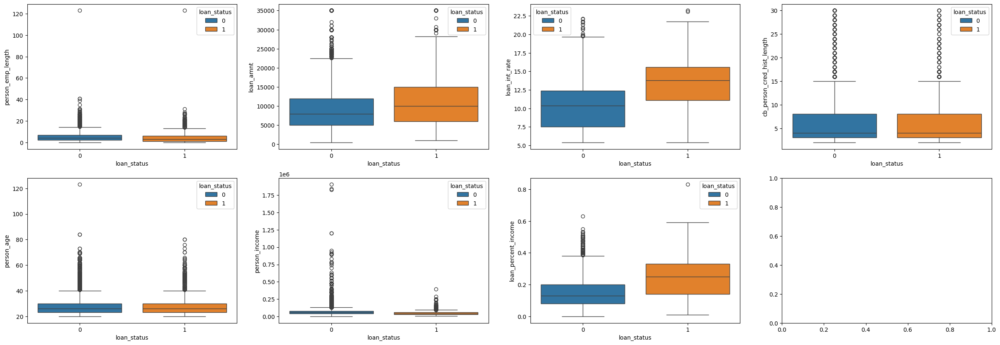

In [16]:
f, axes = plt.subplots(2, 4, figsize=(30, 10))
sns.boxplot(x = "loan_status", y = "person_emp_length", hue="loan_status", data = train_df, ax = axes[0][0])
sns.boxplot(x = "loan_status", y = "person_age", hue="loan_status", data = train_df, ax = axes[1][0])
sns.boxplot(x = "loan_status", y = "loan_amnt", hue="loan_status", data = train_df, ax = axes[0][1])
sns.boxplot(x = "loan_status", y = "person_income", hue="loan_status", data = train_df, ax = axes[1][1])
sns.boxplot(x = "loan_status", y = "loan_int_rate", hue="loan_status", data = train_df, ax = axes[0][2])
sns.boxplot(x = "loan_status", y = "loan_percent_income", hue="loan_status", data = train_df, ax = axes[1][2])
sns.boxplot(x = "loan_status", y = "cb_person_cred_hist_length", hue="loan_status", data = train_df, ax = axes[0][3])


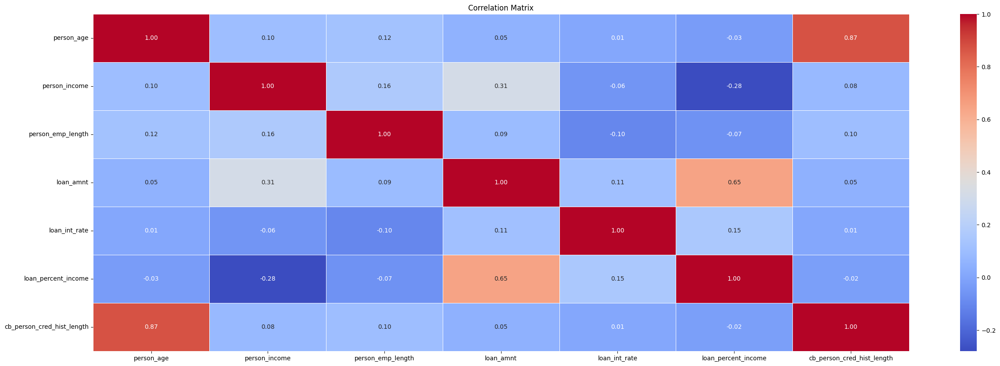

In [17]:
plt.figure(figsize=(30, 10))
corr_matrix = train_df.drop(["id","person_home_ownership","loan_intent", "loan_grade", "cb_person_default_on_file", "loan_status"],axis = 1).corr()
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

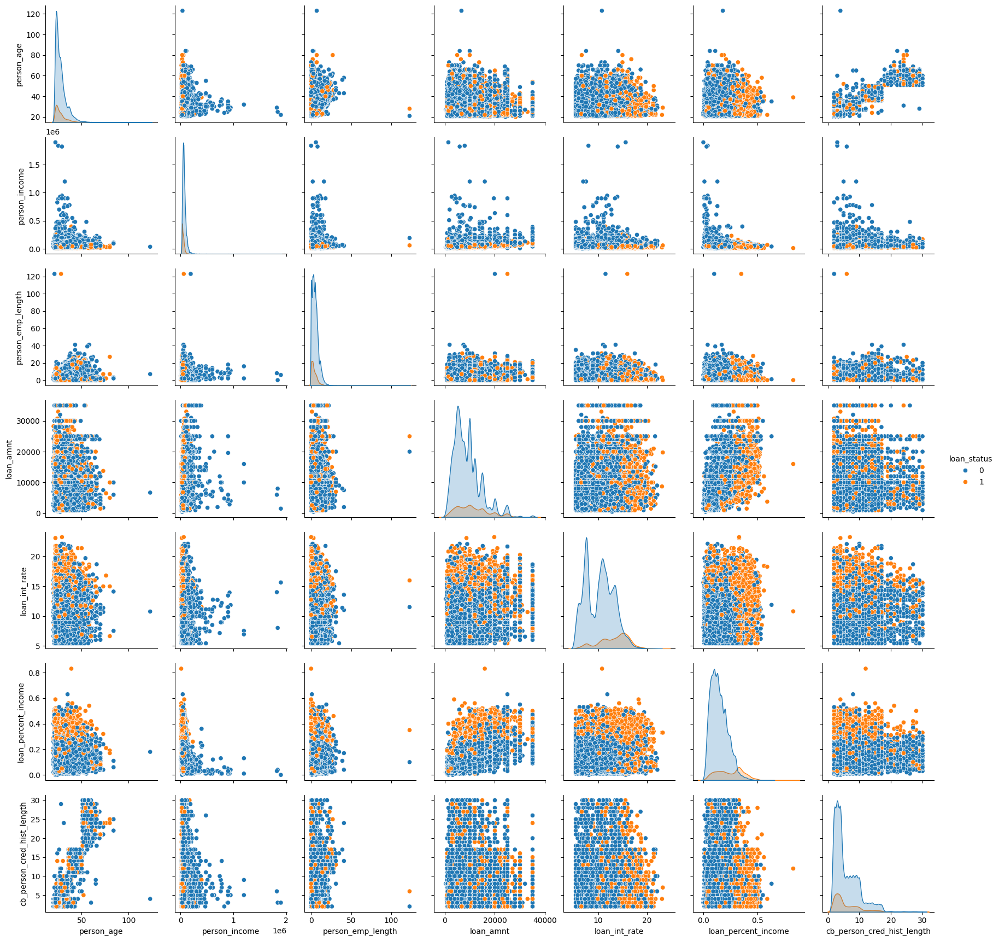

In [18]:
sns.pairplot(train_df.drop(["id","person_home_ownership","loan_intent", "loan_grade","cb_person_default_on_file"],axis = 1), hue="loan_status")

## Logistic Regression

In [19]:
x_train = train_df.drop("loan_status",axis = 1)
y_train = train_df["loan_status"]
x_test = test_df.copy()

In [20]:
categorical_cols = [col for col in x_train.columns if x_train[col].dtype == 'object']

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_cols)
    ],
    remainder='passthrough'  
)

model = Pipeline(steps=[
    ('preprocessor', preprocessor),  
    ('classifier', LogisticRegression(max_iter=10000))  
])
cv_scores = cross_val_score(model, x_train, y_train, cv=5)


print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", cv_scores.mean())

model.fit(x_train, y_train)

y_pred = model.predict(x_test)
y_pred_proba = model.predict_proba(x_test)[:, 1]


/home/mushroom/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/home/mushroom/.local/lib/

Cross-validation scores: [0.90314605 0.90016199 0.90399864 0.90630062 0.90399864]
Average cross-validation score: 0.9035211868019438


/home/mushroom/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [21]:
sub = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/sample_submission.csv")
sub['loan_status'] = y_pred_proba
print(sub)
sub.to_csv("/home/mushroom/kaggle/loan-approval-prediction/data/logi_submission.csv", index=False)

          id  loan_status
0      58645     0.925950
1      58646     0.005949
2      58647     0.672833
3      58648     0.099040
4      58649     0.233562
...      ...          ...
39093  97738     0.053890
39094  97739     0.011964
39095  97740     0.050408
39096  97741     0.814827
39097  97742     0.607038

[39098 rows x 2 columns]


/home/mushroom/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/home/mushroom/.local/lib/

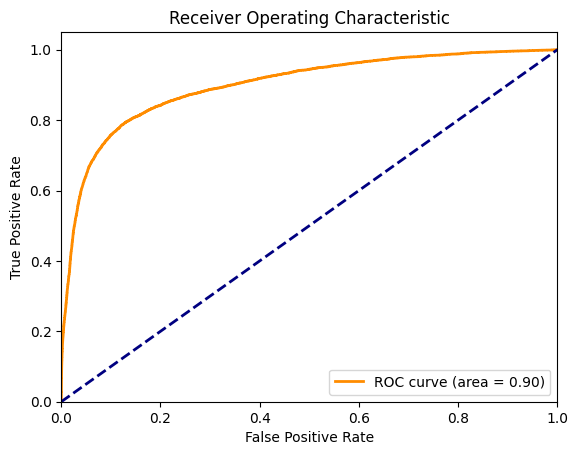

In [22]:
y_scores = cross_val_predict(model, x_train, y_train, cv=5, method='predict_proba')[:, 1]

fpr, tpr, thresholds = roc_curve(y_train, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic")
plt.legend(loc="lower right")
plt.show()

## Random Forest Classification

In [23]:
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=100, class_weight='balanced'))
])

cv_scores = cross_val_score(model, x_train, y_train, cv=5)

print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", cv_scores.mean())

model.fit(x_train, y_train)
y_pred_proba = model.predict_proba(x_test)[:, 1]

Cross-validation scores: [0.94807741 0.95140251 0.95131725 0.95285191 0.94100094]
Average cross-validation score: 0.9489300025577629


In [24]:
sub = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/sample_submission.csv")
sub['loan_status'] = y_pred_proba
print(sub)
sub.to_csv("/home/mushroom/kaggle/loan-approval-prediction/data/rf_submission.csv", index=False)

          id  loan_status
0      58645         0.87
1      58646         0.09
2      58647         0.66
3      58648         0.05
4      58649         0.25
...      ...          ...
39093  97738         0.02
39094  97739         0.00
39095  97740         0.02
39096  97741         0.37
39097  97742         0.94

[39098 rows x 2 columns]


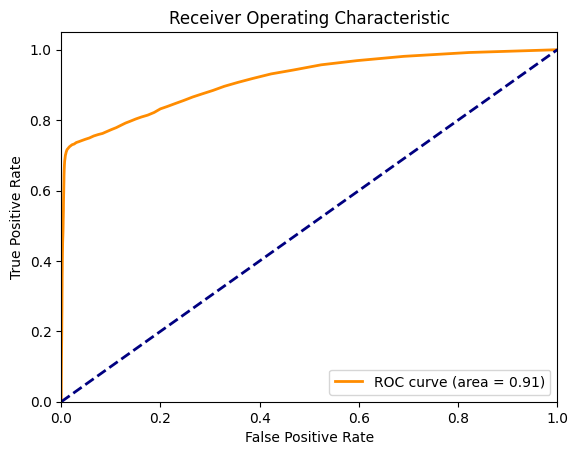

In [25]:
y_scores = cross_val_predict(model, x_train, y_train, cv=5, method='predict_proba')[:, 1]

fpr, tpr, thresholds = roc_curve(y_train, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic")
plt.legend(loc="lower right")
plt.show()

## **Decision Tree Classifier**

In [26]:
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(max_depth=5, random_state=42))
])

cv_scores = cross_val_score(model, x_train, y_train, cv=5)
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", cv_scores.mean())

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_pred_proba = model.predict_proba(x_test)[:, 1] 

Cross-validation scores: [0.94125671 0.94492284 0.94304715 0.94594595 0.90289027]
Average cross-validation score: 0.9356125841930257


In [27]:
sub = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/sample_submission.csv")
sub['loan_status'] = y_pred_proba
print(sub)
sub.to_csv("/home/mushroom/kaggle/loan-approval-prediction/data/dt_submission.csv", index=False)

          id  loan_status
0      58645     0.924316
1      58646     0.033647
2      58647     0.525097
3      58648     0.033647
4      58649     0.177890
...      ...          ...
39093  97738     0.107977
39094  97739     0.033647
39095  97740     0.033647
39096  97741     0.166667
39097  97742     0.971429

[39098 rows x 2 columns]


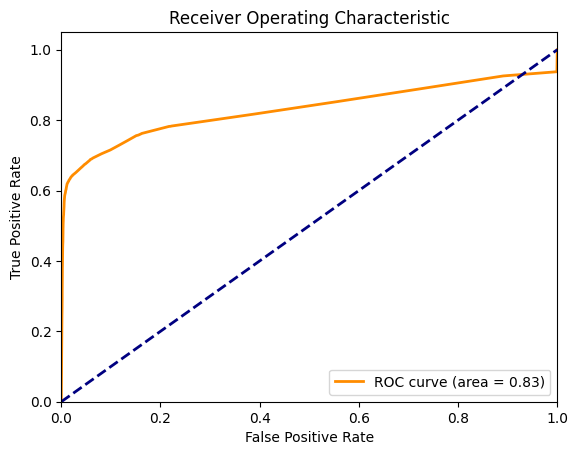

In [28]:
y_scores = cross_val_predict(model, x_train, y_train, cv=5, method='predict_proba')[:, 1]

fpr, tpr, thresholds = roc_curve(y_train, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic")
plt.legend(loc="lower right")
plt.show()

## **AdaBoost Classifier**

In [29]:
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', AdaBoostClassifier(
        estimator=DecisionTreeClassifier(max_depth=1),  # 更新參數名稱
        n_estimators=50,
        random_state=42
    ))
])

cv_scores = cross_val_score(model, x_train, y_train, cv=5)
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", cv_scores.mean())

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_pred_proba = model.predict_proba(x_test)[:, 1] 

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/home/mushroom/.local/lib/python3.10/sit

Cross-validation scores: [0.14272316 0.924546   0.92522807 0.92548384 0.85974934]
Average cross-validation score: 0.7555460823599625


/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



In [30]:
sub = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/sample_submission.csv")
sub['loan_status'] = y_pred_proba
print(sub)
sub.to_csv("/home/mushroom/kaggle/loan-approval-prediction/data/ada_submission.csv", index=False)

          id  loan_status
0      58645     0.520814
1      58646     0.480103
2      58647     0.502466
3      58648     0.482769
4      58649     0.498298
...      ...          ...
39093  97738     0.487168
39094  97739     0.474258
39095  97740     0.479485
39096  97741     0.515648
39097  97742     0.504485

[39098 rows x 2 columns]


/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/home/mushroom/.local/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/home/mushroom/.local/lib/python3.10/sit

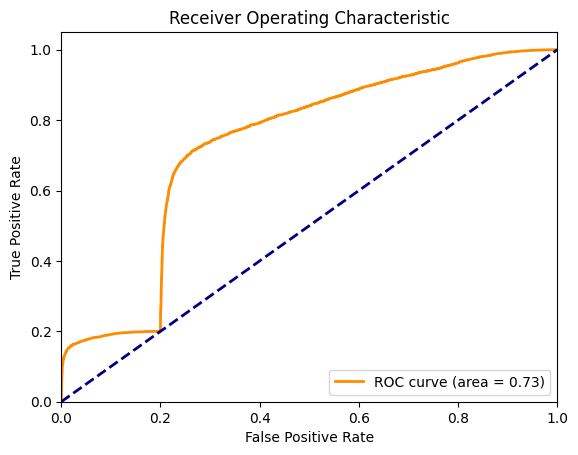

In [31]:
y_scores = cross_val_predict(model, x_train, y_train, cv=5, method='predict_proba')[:, 1]

fpr, tpr, thresholds = roc_curve(y_train, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic")
plt.legend(loc="lower right")
plt.show()

## **XGBoost**

In [32]:
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', XGBClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=5,
        random_state=42,
        use_label_encoder=False,  
        eval_metric='logloss'    
    ))
])


cv_scores = cross_val_score(model, x_train, y_train, cv=5)
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", cv_scores.mean())

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_pred_proba = model.predict_proba(x_test)[:, 1]

/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Cross-validation scores: [0.92727428 0.95259613 0.9518288  0.95549493 0.92735954]
Average cross-validation score: 0.9429107340779265


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [33]:
sub = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/sample_submission.csv")
sub['loan_status'] = y_pred_proba
print(sub)
sub.to_csv("/home/mushroom/kaggle/loan-approval-prediction/data/xgb_submission.csv", index=False)

          id  loan_status
0      58645     0.992651
1      58646     0.022533
2      58647     0.443479
3      58648     0.017856
4      58649     0.107515
...      ...          ...
39093  97738     0.068603
39094  97739     0.005971
39095  97740     0.015096
39096  97741     0.285118
39097  97742     0.942510

[39098 rows x 2 columns]


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:30] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:30] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:30] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:31] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




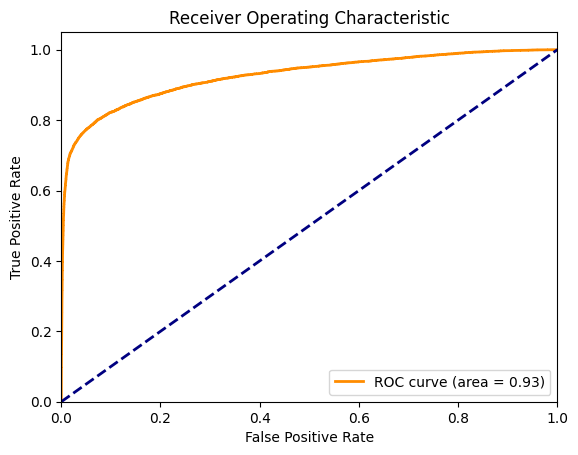

In [34]:
y_scores = cross_val_predict(model, x_train, y_train, cv=5, method='predict_proba')[:, 1]

fpr, tpr, thresholds = roc_curve(y_train, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic")
plt.legend(loc="lower right")
plt.show()

In [35]:
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', XGBClassifier(
        n_estimators=150,
        learning_rate=0.2,
        max_depth=7,
        random_state=42,
        use_label_encoder=False,  
        eval_metric='logloss'    
    ))
])


cv_scores = cross_val_score(model, x_train, y_train, cv=5)
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", cv_scores.mean())

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_pred_proba = model.predict_proba(x_test)[:, 1]

/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:31] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:31] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Cross-validation scores: [0.91465598 0.95216984 0.94944156 0.94952681 0.90493648]
Average cross-validation score: 0.9341461335152188


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [36]:
sub = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/sample_submission.csv")
sub['loan_status'] = y_pred_proba
print(sub)
sub.to_csv("/home/mushroom/kaggle/loan-approval-prediction/data/xgb1_submission.csv", index=False)

          id  loan_status
0      58645     0.999925
1      58646     0.011442
2      58647     0.362486
3      58648     0.006985
4      58649     0.064024
...      ...          ...
39093  97738     0.023289
39094  97739     0.000561
39095  97740     0.006007
39096  97741     0.133355
39097  97742     0.936230

[39098 rows x 2 columns]


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


/home/mushroom/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[13:30:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




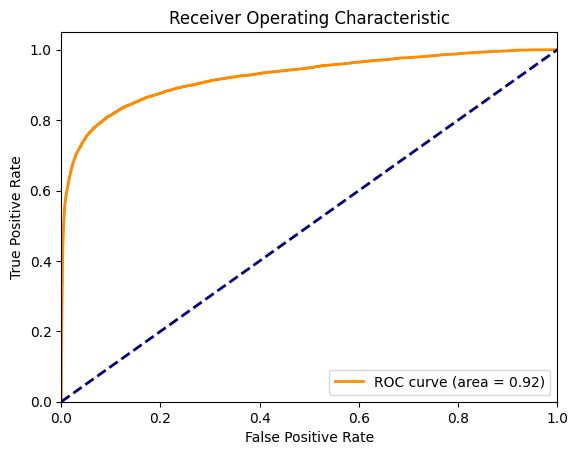

In [37]:
y_scores = cross_val_predict(model, x_train, y_train, cv=5, method='predict_proba')[:, 1]

fpr, tpr, thresholds = roc_curve(y_train, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic")
plt.legend(loc="lower right")
plt.show()

## **CatBoost**

In [39]:
model = CatBoostClassifier(
    iterations=1000,       
    learning_rate=0.1,     
    depth=6,               
    eval_metric='Logloss', 
    cat_features=["person_home_ownership","loan_intent", "loan_grade","cb_person_default_on_file"], 
    random_seed=42,
    verbose=100            
)


cv_scores = cross_val_score(model, x_train, y_train, cv=5)
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", cv_scores.mean())

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_pred_proba = model.predict_proba(x_test)[:, 1]

0:	learn: 0.5702798	total: 61.3ms	remaining: 1m 1s
100:	learn: 0.1540095	total: 1.28s	remaining: 11.4s
200:	learn: 0.1400424	total: 2.56s	remaining: 10.2s
300:	learn: 0.1313572	total: 3.81s	remaining: 8.85s
400:	learn: 0.1238744	total: 5.09s	remaining: 7.6s
500:	learn: 0.1177684	total: 6.48s	remaining: 6.45s
600:	learn: 0.1123825	total: 7.82s	remaining: 5.19s
700:	learn: 0.1075923	total: 9.16s	remaining: 3.91s
800:	learn: 0.1030859	total: 10.5s	remaining: 2.62s
900:	learn: 0.0989396	total: 12s	remaining: 1.31s
999:	learn: 0.0950588	total: 13.4s	remaining: 0us
0:	learn: 0.5709914	total: 16.9ms	remaining: 16.9s
100:	learn: 0.1549849	total: 1.36s	remaining: 12.2s
200:	learn: 0.1415688	total: 2.78s	remaining: 11.1s
300:	learn: 0.1318742	total: 4.23s	remaining: 9.82s
400:	learn: 0.1239664	total: 5.7s	remaining: 8.52s
500:	learn: 0.1178038	total: 7.18s	remaining: 7.16s
600:	learn: 0.1126533	total: 8.68s	remaining: 5.76s
700:	learn: 0.1074416	total: 10.1s	remaining: 4.3s
800:	learn: 0.1025941

In [40]:
sub = pd.read_csv("/home/mushroom/kaggle/loan-approval-prediction/data/sample_submission.csv")
sub['loan_status'] = y_pred_proba
print(sub)
sub.to_csv("/home/mushroom/kaggle/loan-approval-prediction/data/cat_submission.csv", index=False)

          id  loan_status
0      58645     0.999933
1      58646     0.009423
2      58647     0.703594
3      58648     0.008696
4      58649     0.032125
...      ...          ...
39093  97738     0.018162
39094  97739     0.001286
39095  97740     0.003432
39096  97741     0.140684
39097  97742     0.976012

[39098 rows x 2 columns]


0:	learn: 0.5702798	total: 16.8ms	remaining: 16.8s
100:	learn: 0.1540095	total: 1.37s	remaining: 12.2s
200:	learn: 0.1400424	total: 2.68s	remaining: 10.7s
300:	learn: 0.1313572	total: 3.99s	remaining: 9.28s
400:	learn: 0.1238744	total: 5.39s	remaining: 8.05s
500:	learn: 0.1177684	total: 6.74s	remaining: 6.71s
600:	learn: 0.1123825	total: 8.18s	remaining: 5.43s
700:	learn: 0.1075923	total: 9.53s	remaining: 4.06s
800:	learn: 0.1030859	total: 10.9s	remaining: 2.71s
900:	learn: 0.0989396	total: 12.3s	remaining: 1.35s
999:	learn: 0.0950588	total: 13.9s	remaining: 0us
0:	learn: 0.5709914	total: 13.9ms	remaining: 13.9s
100:	learn: 0.1549849	total: 1.44s	remaining: 12.8s
200:	learn: 0.1415688	total: 2.89s	remaining: 11.5s
300:	learn: 0.1318742	total: 4.25s	remaining: 9.87s
400:	learn: 0.1239664	total: 5.68s	remaining: 8.49s
500:	learn: 0.1178038	total: 7.12s	remaining: 7.09s
600:	learn: 0.1126533	total: 8.53s	remaining: 5.66s
700:	learn: 0.1074416	total: 9.97s	remaining: 4.25s
800:	learn: 0.10

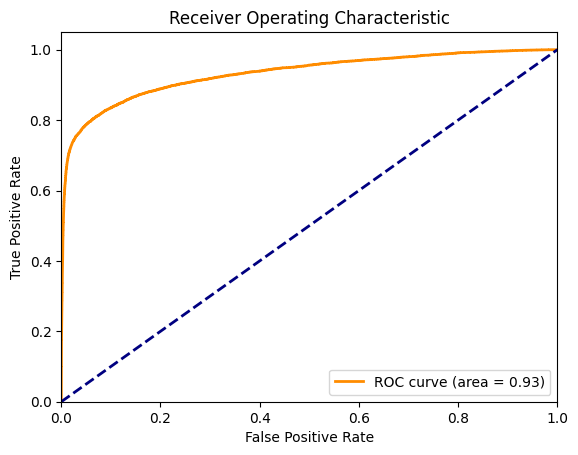

In [42]:
y_scores = cross_val_predict(model, x_train, y_train, cv=5, method='predict_proba')[:, 1]

fpr, tpr, thresholds = roc_curve(y_train, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic")
plt.legend(loc="lower right")
plt.show()